In [2]:
import scanpy as sc 
import pandas as pd
import anndata as ad
import matplotlib.pyplot as plt
import igraph
import numpy as np


In [241]:
import scvelo as scv

In [ ]:
## mapping using cellxgene ensembleID files 

In [53]:
FT=sc.read_h5ad('/Users/user/Documents/Fallopiantube/newanalysis/weigert.h5ad')

In [155]:
FT

AnnData object with n_obs × n_vars = 131218 × 60054
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'alignment_software', 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'donor_living_at_sample_collection', 'donor_menopausal_status', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_derivation_process', 'menstrual_phase_at_collection', 'sample_source', 'donor_BMI_at_collection', 'tissue_type', 'suspension_derivation_process', 'suspension_dissociation_reagent', 'suspension_dissociation_time', 'suspension_percent_cell_viability', 'suspension_uuid', 'suspension_type', 'tissue_handling_interval', 'library_uuid', 'assay_ontology_term_id', 'library_starting_quantity', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'integrated_snn_res.0.5'

In [54]:
FTmeta = pd.crosstab(FT.obs['is_primary_data'], FT.obs['donor_id'])
FTmeta

donor_id,D1_2509,D1_3041,D2_3061,D2_3508,D3_3203,D3_3586,D4_3295,D4_3604,D5_3296,D5_3619,D6_3369,D6_3636,D7_3391,D7_3643,D8_3668,D9_3669,D10_3679
is_primary_data,,,,,,,,,,,,,,,,,
False,0,877,630,0,9008,0,6252,0,15755,0,7914,0,5675,0,0,0,0
True,9155,0,0,11114,0,6171,0,9469,0,12190,0,11734,0,8432,4544,6391,5907


In [55]:
gene_ids = FT.var_names
gene_ids = pd.DataFrame(gene_ids)
gene_ids.to_csv('geneids.csv')

In [56]:
gene_names=pd.read_csv('/Users/user/Documents/Fallopiantube/newanalysis/new_genes_homo_sapiens.csv', header=None)
gene_names.columns = ["ensemblid", "genename",'val1','val2']

In [57]:
gene_names

,ensemblid,genename,val1,val2
0,ENSG00000223972,DDX11L1,5,1735
1,ENSG00000227232,WASH7P,5,1351
2,ENSG00000278267,MIR6859-1,1,68
3,ENSG00000243485,MIR1302-2HG,5,1021
4,ENSG00000284332,MIR1302-2,1,138
...,...,...,...,...
60659,ENSG00000276017,ENSG00000276017.1,1,2404
60660,ENSG00000278817,ENSG00000278817.1,1,1213
60661,ENSG00000277196,ENSG00000277196.4,4,2405
60662,ENSG00000278625,U6_ENSG00000278625,1,106


In [58]:
gene_names=gene_names.set_index('ensemblid')

In [59]:
FT.var['genes']= gene_names['genename']

In [60]:
FT.var

,feature_is_filtered,feature_name,feature_reference,feature_biotype,feature_length,feature_type,genes
ENSG00000000003,False,TSPAN6,NCBITaxon:9606,gene,2396,protein_coding,TSPAN6
ENSG00000000005,False,TNMD,NCBITaxon:9606,gene,873,protein_coding,TNMD
ENSG00000000419,False,DPM1,NCBITaxon:9606,gene,1262,protein_coding,DPM1
ENSG00000000457,False,SCYL3,NCBITaxon:9606,gene,2916,protein_coding,SCYL3
ENSG00000000460,False,C1orf112,NCBITaxon:9606,gene,2661,protein_coding,C1orf112
...,...,...,...,...,...,...,...
ENSG00000288321,True,ENSG00000288321.1,NCBITaxon:9606,gene,2001,lncRNA,RP11-484N11.1
ENSG00000288330,True,ENSG00000288330.1,NCBITaxon:9606,gene,1601,TEC,ATXN8
ENSG00000288398,False,ENSG00000288398.1,NCBITaxon:9606,gene,2662,lncRNA,RP4-733M16.8
ENSG00000288459,True,ENSG00000288459.1,NCBITaxon:9606,gene,660,lncRNA,RP11-260M19.4


In [61]:
FT.var['gene_names']=FT.var_names

In [62]:
FT.var

,feature_is_filtered,feature_name,feature_reference,feature_biotype,feature_length,feature_type,genes,gene_names
ENSG00000000003,False,TSPAN6,NCBITaxon:9606,gene,2396,protein_coding,TSPAN6,ENSG00000000003
ENSG00000000005,False,TNMD,NCBITaxon:9606,gene,873,protein_coding,TNMD,ENSG00000000005
ENSG00000000419,False,DPM1,NCBITaxon:9606,gene,1262,protein_coding,DPM1,ENSG00000000419
ENSG00000000457,False,SCYL3,NCBITaxon:9606,gene,2916,protein_coding,SCYL3,ENSG00000000457
ENSG00000000460,False,C1orf112,NCBITaxon:9606,gene,2661,protein_coding,C1orf112,ENSG00000000460
...,...,...,...,...,...,...,...,...
ENSG00000288321,True,ENSG00000288321.1,NCBITaxon:9606,gene,2001,lncRNA,RP11-484N11.1,ENSG00000288321
ENSG00000288330,True,ENSG00000288330.1,NCBITaxon:9606,gene,1601,TEC,ATXN8,ENSG00000288330
ENSG00000288398,False,ENSG00000288398.1,NCBITaxon:9606,gene,2662,lncRNA,RP4-733M16.8,ENSG00000288398
ENSG00000288459,True,ENSG00000288459.1,NCBITaxon:9606,gene,660,lncRNA,RP11-260M19.4,ENSG00000288459


In [63]:
FT.var_names = FT.var["genes"].values

In [64]:
FT.var_names

Index([       'TSPAN6',          'TNMD',          'DPM1',         'SCYL3',
            'C1orf112',           'FGR',           'CFH',         'FUCA2',
                'GCLC',          'NFYA',
       ...
          'RP11-8L8.5',    'RP11-8L8.4', 'CTD-3018O17.7', 'CH17-342O10.3',
        'RP11-909M7.5', 'RP11-484N11.1',         'ATXN8',  'RP4-733M16.8',
       'RP11-260M19.4',        'SMIM42'],
      dtype='object', length=60054)

In [65]:
FT.var_names = FT.var_names.astype(str)
FT.var_names_make_unique()

In [66]:
gene_name = "OVGP1"  # Example gene
if gene_name in FT.var_names:
    print(f"Gene {gene_name} found at index {FT.var_names.get_loc(gene_name)}")
else:
    print(f"Gene {gene_name} not found")

Gene OVGP1 found at index 1657


In [67]:
print(FT.raw.var_names)

Index(['ENSG00000000003', 'ENSG00000000005', 'ENSG00000000419',
       'ENSG00000000457', 'ENSG00000000460', 'ENSG00000000938',
       'ENSG00000000971', 'ENSG00000001036', 'ENSG00000001084',
       'ENSG00000001167',
       ...
       'ENSG00000288245', 'ENSG00000288252', 'ENSG00000288253',
       'ENSG00000288300', 'ENSG00000288302', 'ENSG00000288321',
       'ENSG00000288330', 'ENSG00000288398', 'ENSG00000288459',
       'ENSG00000288460'],
      dtype='object', length=60054)


In [68]:
sc.pp.calculate_qc_metrics(FT, inplace=True)

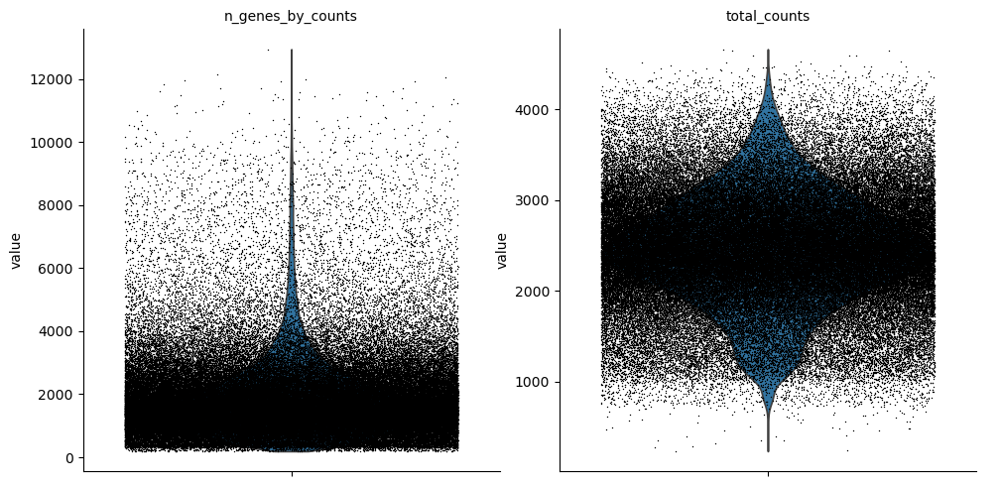

In [69]:
sc.pl.violin(FT, ['n_genes_by_counts','total_counts'],jitter=0.4,
    multi_panel=True,)

In [70]:
FT = FT[FT.obs.n_genes_by_counts < 6000, :]

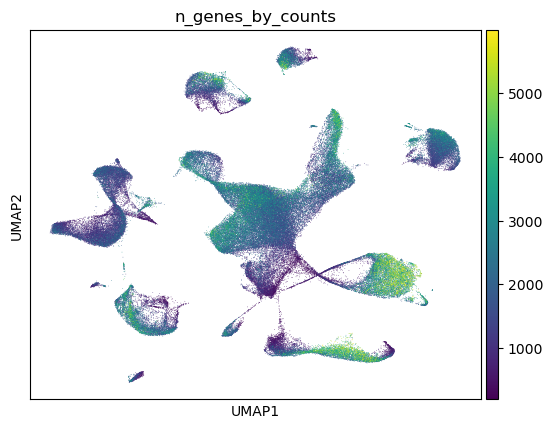

In [71]:
sc.pl.umap(FT, color=['n_genes_by_counts'], use_raw=False)

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


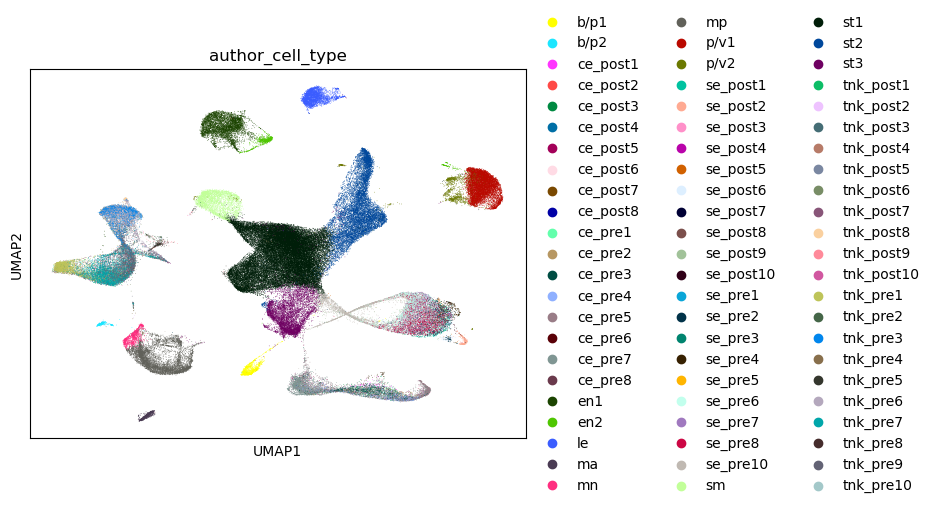

In [72]:
sc.pl.umap(FT, color=['author_cell_type'], use_raw=False)

In [73]:
FT=FT[FT.obs['donor_menopausal_status'].isin(['premenopausal'])]

In [74]:
FT.obs['author_cell_type'].value_counts()

author_cell_type
st1          23450
st2           6493
mp            4686
se_pre10      4089
tnk_pre9      4031
st3           3859
tnk_pre6      3507
tnk_pre7      3431
ce_pre7       3116
ce_pre5       2904
tnk_pre1      2624
sm            2094
le            1980
en1           1723
se_pre7       1633
p/v1          1455
tnk_pre3      1361
se_pre8       1322
se_pre6       1098
se_pre2       1070
b/p1          1065
mn             931
ce_pre3        845
ma             791
ce_pre1        744
ce_pre4        728
p/v2           409
se_pre4        349
tnk_pre5       317
ce_pre2        183
tnk_pre2       170
en2            157
b/p2            98
tnk_pre10       64
tnk_pre4        50
se_pre3         32
ce_pre8         29
ce_pre6         23
tnk_pre8         7
se_pre1          3
se_pre5          2
Name: count, dtype: int64

In [75]:
epithelial=['se_pre10','ce_pre7','ce_pre5','se_pre7','se_pre8','se_pre6',
            'se_pre2','ce_pre3','ce_pre1','ce_pre_4','se_pre_3','se_pre4',
            'se_pre1','ce_pre2','se_pre5','ce_pre6','ce_pre8','se_pre9','ce_pre4','se_pre3']
epi=FT[FT.obs['author_cell_type'].isin(epithelial)]

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:488: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


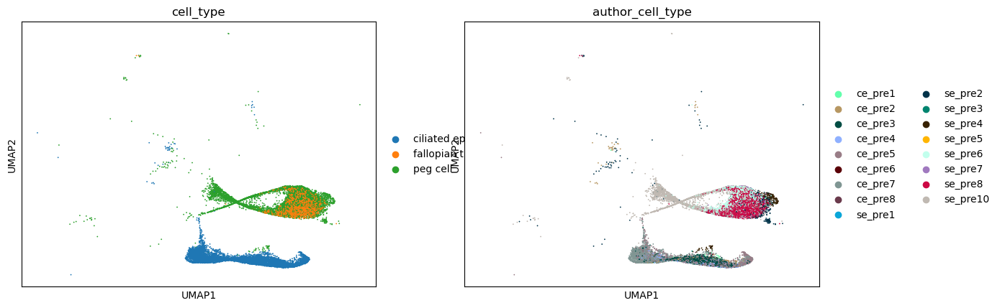

In [76]:
sc.pl.umap(epi, color=['cell_type','author_cell_type'])

In [77]:
epi.obs['author_cell_type'].value_counts()

author_cell_type
se_pre10    4089
ce_pre7     3116
ce_pre5     2904
se_pre7     1633
se_pre8     1322
se_pre6     1098
se_pre2     1070
ce_pre3      845
ce_pre1      744
ce_pre4      728
se_pre4      349
ce_pre2      183
se_pre3       32
ce_pre8       29
ce_pre6       23
se_pre1        3
se_pre5        2
Name: count, dtype: int64

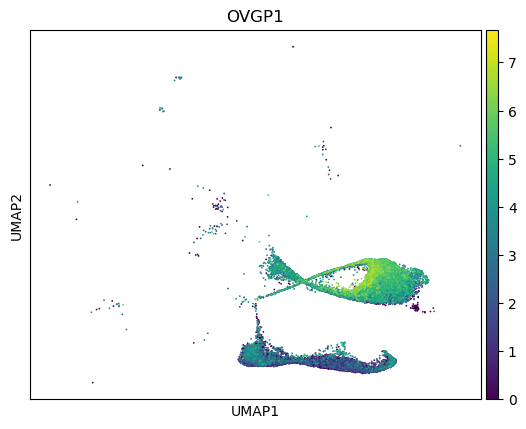

In [78]:
sc.pl.umap(epi, color=['OVGP1'], use_raw=False)

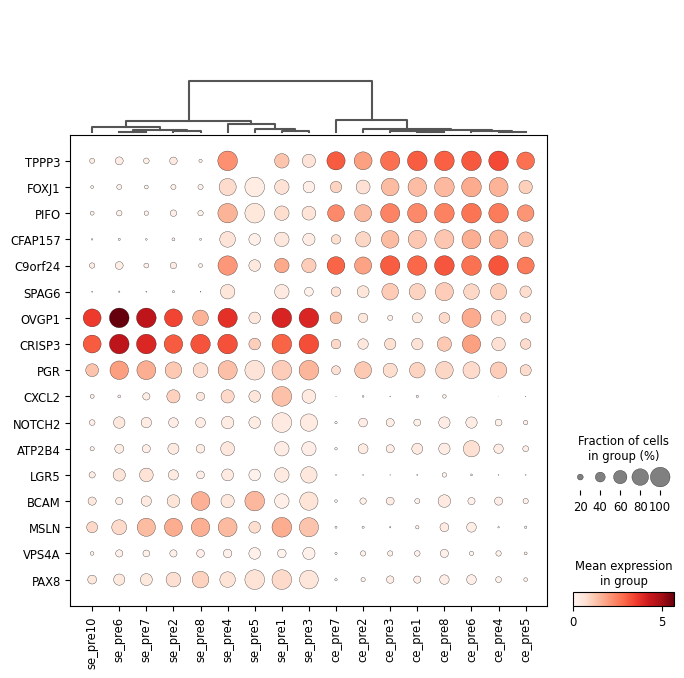

In [79]:
marker_genes= ['TPPP3','FOXJ1','PIFO','CFAP157','C9orf24','SPAG6','OVGP1',
               'CRISP3','PGR','CXCL2','NOTCH2','ATP2B4','LGR5','BCAM',
               'MSLN','VPS4A','PAX8']

sc.tl.dendrogram(epi, groupby='author_cell_type')

sc.pl.dotplot(epi, marker_genes, groupby='author_cell_type', dendrogram=True, var_group_rotation=[90],swap_axes=True, use_raw=False)

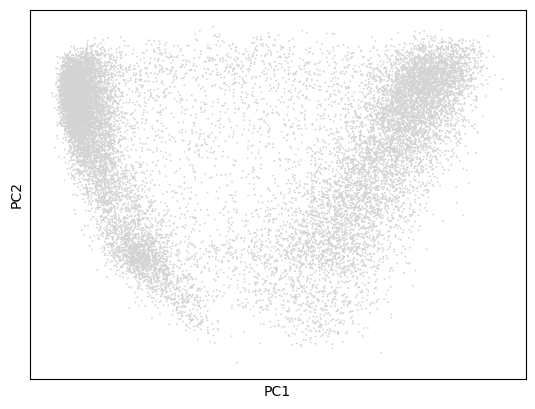

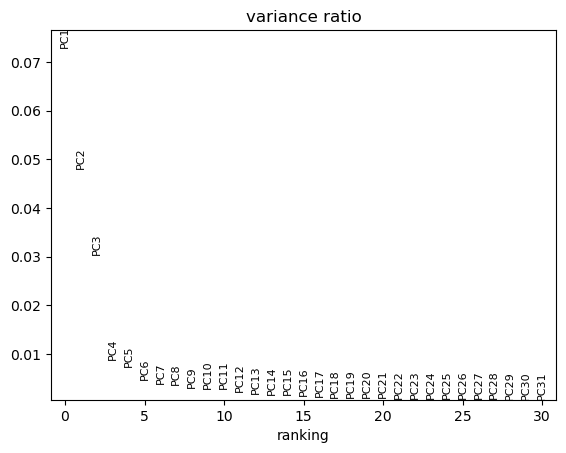

In [80]:
#sc.pp.combat(epi, key='donor_id', inplace=True)
sc.tl.pca(epi, svd_solver="arpack")
sc.pl.pca(epi)
sc.pl.pca_variance_ratio(epi)

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


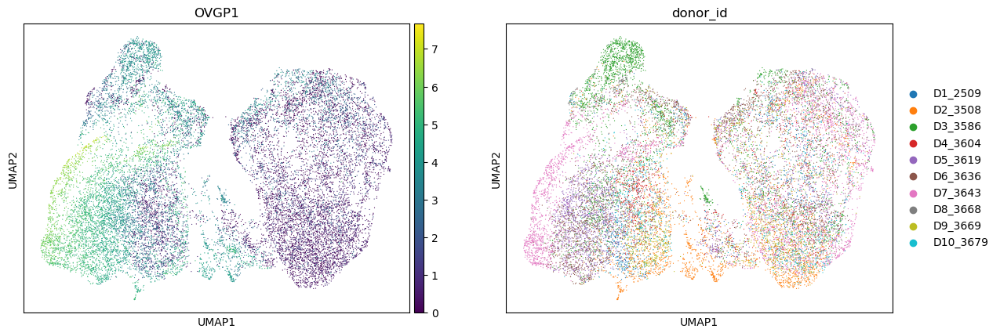

In [81]:
##final umap parameters 

sc.pp.neighbors(epi, n_neighbors=10, n_pcs=6)
sc.tl.umap(epi, min_dist=0.3, spread=0.8)
sc.pl.umap(
    epi,
    color=["OVGP1","donor_id"],size=3, use_raw=False
)

In [5]:

marker_genes= ['TPPP3','FOXJ1','PIFO','CFAP157','C9orf24','SPAG6','OVGP1',
               'CRISP3','PGR','CXCL2','NOTCH2','ATP2B4','LGR5','BCAM',
               'MSLN','VPS4A','PAX8']


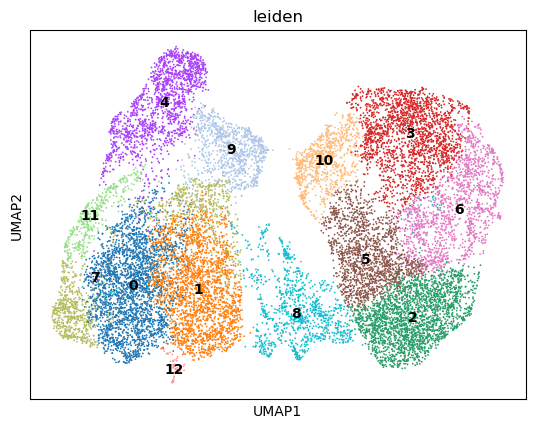

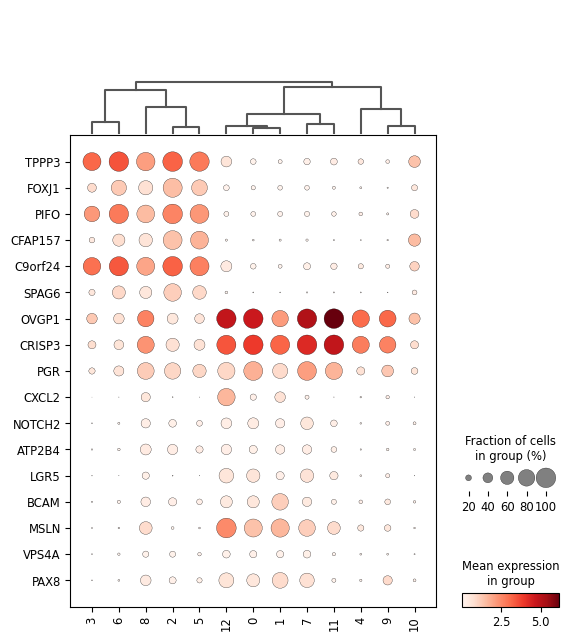

In [83]:
sc.tl.leiden(epi, resolution=0.4)
sc.pl.umap(epi, color='leiden', legend_loc='on data')

marker_genes= ['TPPP3','FOXJ1','PIFO','CFAP157','C9orf24','SPAG6','OVGP1',
               'CRISP3','PGR','CXCL2','NOTCH2','ATP2B4','LGR5','BCAM',
               'MSLN','VPS4A','PAX8']

sc.tl.dendrogram(epi, groupby='leiden')

sc.pl.dotplot(epi, marker_genes, groupby='leiden', dendrogram=True, var_group_rotation=[90],swap_axes=True, use_raw=False)


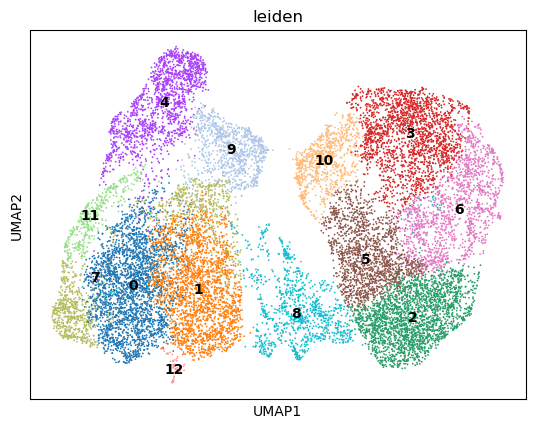

In [84]:
sc.pl.umap(epi, color='leiden', legend_loc='on data')

In [87]:
clusterannotation = {
    "0":'Mature Secretory 1',
    "1":'Mature Secretory 2',
    "2":'Mature Multiciliated 1',
    "3":'Pre-ciliated 2',
    "4":'Progenitor',
    "5":'Mature Multiciliated 1',
    "6":'Mature Multicilated 2',
    "7": 'Mature Secretory 1',
    "8": 'OVGP1+ Multiciliated',
    "9": 'Progenitor',
    "10": 'Pre-ciliated 1',
    "11": 'Mature Secretory 1',
    "12": 'Mature Secretory 3'}

epi.obs["Cell Type"] = epi.obs["leiden"].map(clusterannotation).astype("category")

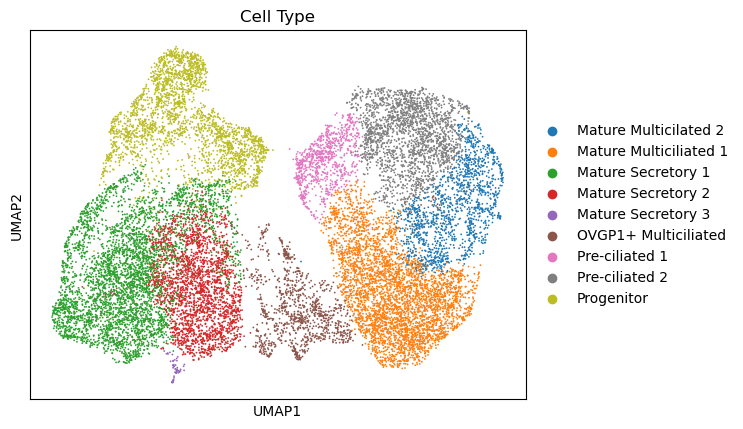

In [88]:
sc.pl.umap(epi, color='Cell Type')

In [89]:
sc.tl.paga(epi,groups='Cell Type')

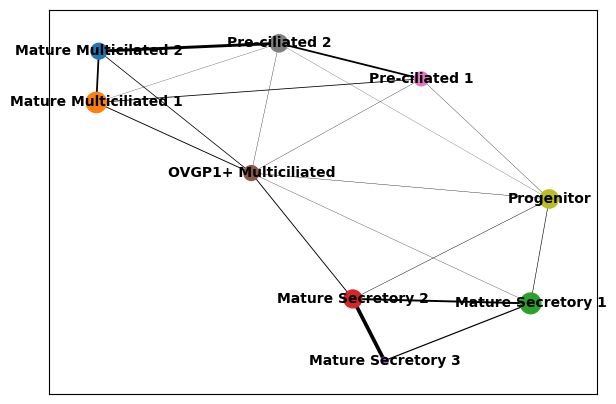

In [90]:
sc.pl.paga(epi)

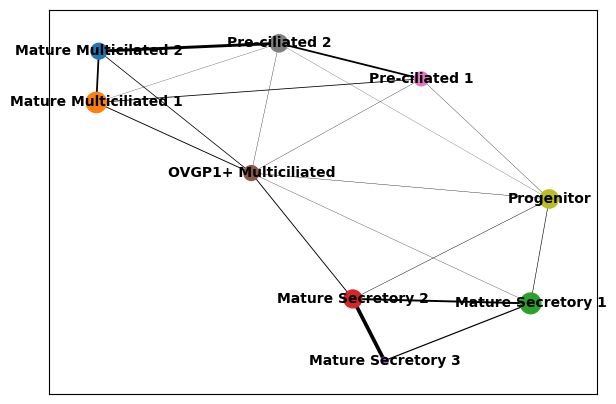

In [207]:
sc.pl.paga(epi)

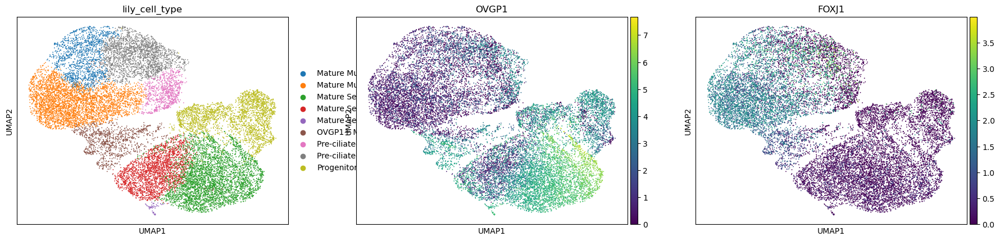

In [91]:
sc.tl.umap(epi, init_pos='paga')
sc.pl.umap(epi, color=['lily_cell_type', 'OVGP1','FOXJ1'], use_raw=False)

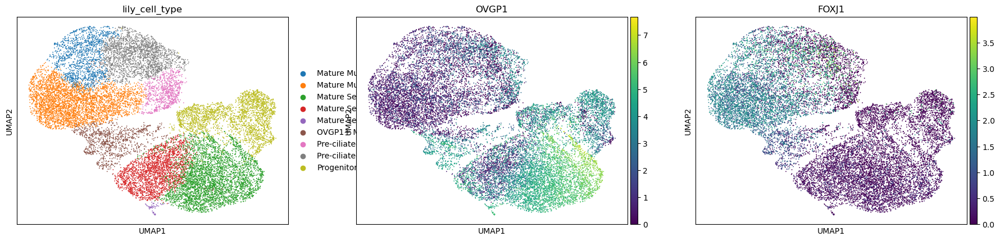

In [228]:
sc.tl.umap(epi, init_pos='paga')
sc.pl.umap(epi, color=['lily_cell_type', 'OVGP1','FOXJ1'], use_raw=False)

In [92]:
epi.uns["iroot"] = np.flatnonzero(epi.obs["lily_cell_type"] == "Progenitor")[0]

In [93]:
sc.tl.diffmap(epi, n_comps=20)
sc.tl.dpt(epi, n_branchings=2)

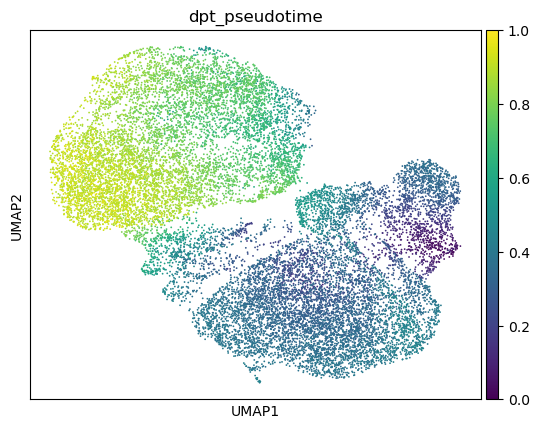

In [94]:
sc.pl.umap(epi, color='dpt_pseudotime')

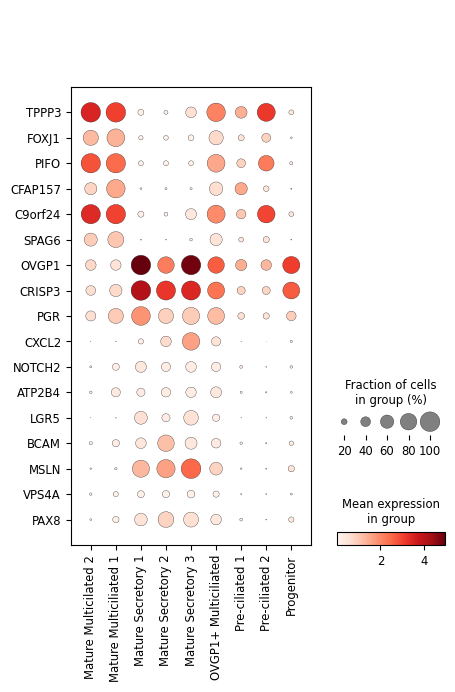

In [6]:
sc.tl.dendrogram(epi, groupby='lily_cell_type')

sc.pl.dotplot(epi, marker_genes, groupby='lily_cell_type', dendrogram=False, var_group_rotation=[90],swap_axes=True, use_raw=False)


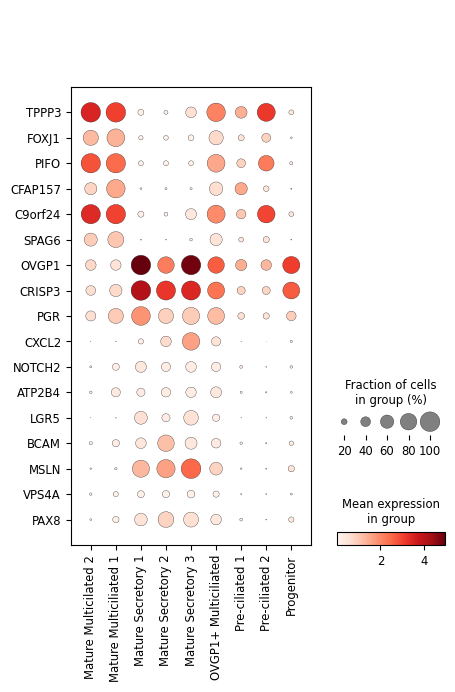

In [7]:
sc.tl.dendrogram(epi, groupby='lily_cell_type')

sc.pl.dotplot(epi, marker_genes, groupby='lily_cell_type', dendrogram=False, var_group_rotation=[90],swap_axes=True, use_raw=False, save='weigertdotplot.png')


In [229]:
results_file=('finalepi_weigert.h5ad')
epi.write(results_file)

In [3]:
##('/Users/user/Documents/Fallopiantube/newanalysis/finaldepi_weigert.h5ad')


epi=sc.read_h5ad('/Users/user/Documents/Fallopiantube/newanalysis/finalepi_weigert.h5ad')

In [4]:
epi

AnnData object with n_obs × n_vars = 18170 × 60054
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'alignment_software', 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'donor_living_at_sample_collection', 'donor_menopausal_status', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_derivation_process', 'menstrual_phase_at_collection', 'sample_source', 'donor_BMI_at_collection', 'tissue_type', 'suspension_derivation_process', 'suspension_dissociation_reagent', 'suspension_dissociation_time', 'suspension_percent_cell_viability', 'suspension_uuid', 'suspension_type', 'tissue_handling_interval', 'library_uuid', 'assay_ontology_term_id', 'library_starting_quantity', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'integrated_snn_res.0.5',

In [7]:
epi_palette = [  
#Mature Multiciliated 2
'#006edb',
#Mature Multiciliated 1
'#019e5d', 
#Mature Secretory 1
'#FAD510',
#Mature Secretory 2
'#f9b5d1',
#Mature Secretory 3
'#ff7b00',
#OVGP1+ Multiciliated
'#0AD7D3',
#Pre-ciliated 1
'#371377',
#Pre-ciliated 2
'#9d66c4',
#Progenitor 
'#9E0142',]

epi.uns['lily_cell_type_colors'] = np.array(epi_palette, dtype=object)


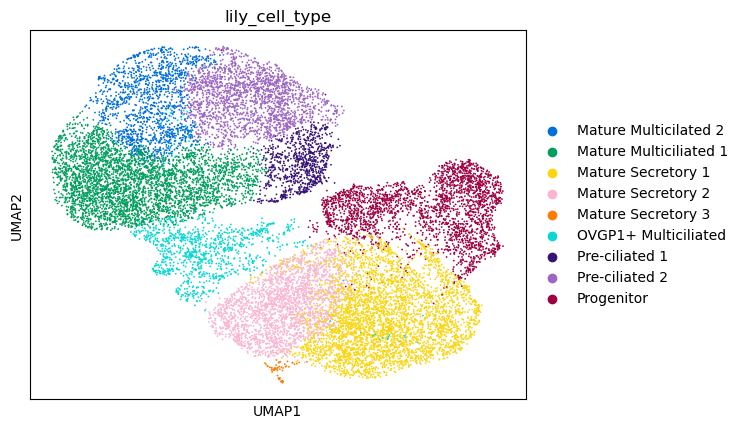

In [9]:
sc.pl.umap(epi, color='lily_cell_type')

In [10]:
ciliated = epi[epi.obs['lily_cell_type'].isin(['Progenitor','Pre-ciliated 1','Pre-ciliated 2','Mature Multiciliated 1','Mature Multicilated 2'])]

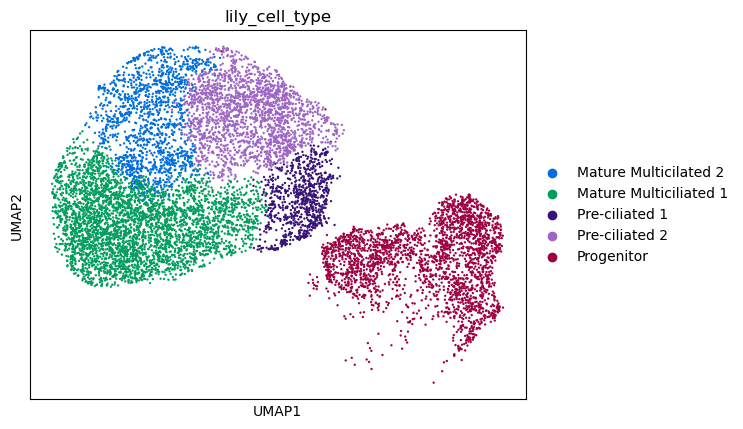

In [12]:
sc.pl.umap(ciliated, color='lily_cell_type')

In [105]:
ciliated

View of AnnData object with n_obs × n_vars = 10584 × 60054
    obs: 'mapped_reference_assembly', 'mapped_reference_annotation', 'alignment_software', 'donor_id', 'self_reported_ethnicity_ontology_term_id', 'donor_living_at_sample_collection', 'donor_menopausal_status', 'organism_ontology_term_id', 'sample_uuid', 'sample_preservation_method', 'tissue_ontology_term_id', 'development_stage_ontology_term_id', 'sample_derivation_process', 'menstrual_phase_at_collection', 'sample_source', 'donor_BMI_at_collection', 'tissue_type', 'suspension_derivation_process', 'suspension_dissociation_reagent', 'suspension_dissociation_time', 'suspension_percent_cell_viability', 'suspension_uuid', 'suspension_type', 'tissue_handling_interval', 'library_uuid', 'assay_ontology_term_id', 'library_starting_quantity', 'is_primary_data', 'cell_type_ontology_term_id', 'author_cell_type', 'disease_ontology_term_id', 'sex_ontology_term_id', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'integrated_snn_r

In [106]:
ciliated.uns["iroot"] = np.flatnonzero(ciliated.obs["lily_cell_type"] == "Progenitor")[0]
sc.tl.diffmap(ciliated, n_comps=20)
sc.tl.dpt(ciliated, n_branchings=1, n_dcs=20, min_group_size=1.5 )

/var/folders/qx/wvzlf9bn5j9glv19g042gdg40000gp/T/ipykernel_86960/2597262261.py:1: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  ciliated.uns["iroot"] = np.flatnonzero(ciliated.obs["lily_cell_type"] == "Progenitor")[0]


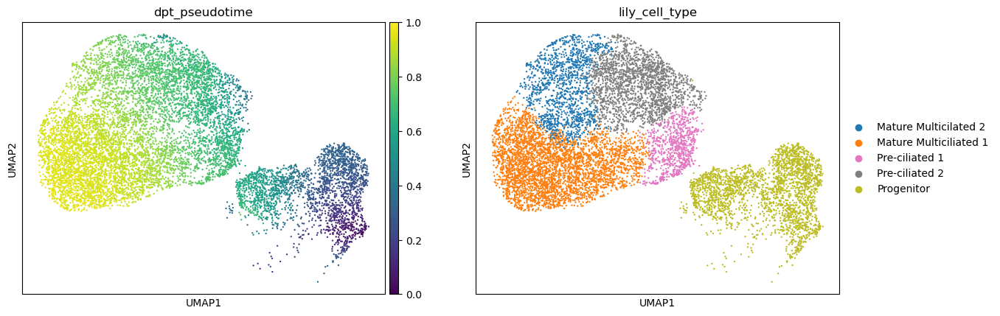

In [107]:
sc.pl.umap(ciliated, color=['dpt_pseudotime','lily_cell_type'])

In [108]:
gene_names =['OVGP1','FOXJ1','SPAG6','PIFO','CFAP157','C9orf24']

In [109]:
path = ['Progenitor','Pre-ciliated 1','Pre-ciliated 2','Mature Multicilated 2','Mature Multiciliated 1',]
ciliated.obs["distance"] = ciliated.obs["dpt_pseudotime"]
ciliated.obs["Cell Types"] = ciliated.obs["lily_cell_type"]
ciliated.uns["clusters_colors"] = ciliated.uns["lily_cell_type_colors"]

KeyError: "None of [Index(['Cell Types'], dtype='object')] are in the [columns]"

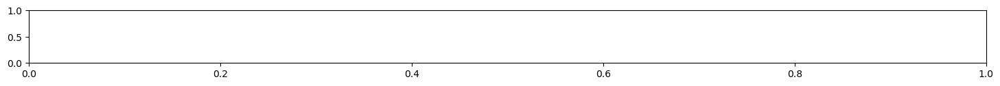

In [52]:
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(ciliated, path, gene_names, annotations=['dpt_pseudotime'], use_raw=False, ytick_fontsize=8)

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


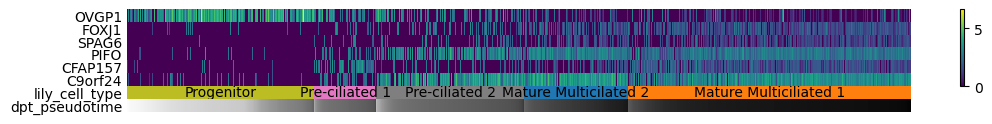

In [313]:
fig, ax = plt.subplots(figsize=(14, 1))
sc.pl.paga_path(ciliated, path, gene_names,annotations=['dpt_pseudotime'], use_raw=False)

In [32]:
epi=sc.read_h5ad('/Users/user/Documents/Fallopiantube/newanalysis/finalepi_weigert.h5ad')

In [110]:
ciliated = epi[epi.obs['lily_cell_type'].isin(['Progenitor','Pre-ciliated 1','Pre-ciliated 2','Mature Multiciliated 1','Mature Multicilated 2','OVGP1+ Multiciliated' ])]
ciliated.uns["iroot"] = np.flatnonzero(ciliated.obs["lily_cell_type"] == "Progenitor")[0]
sc.tl.diffmap(ciliated, n_comps=20)
sc.tl.dpt(ciliated, n_branchings=1, n_dcs=20, min_group_size=1.5 )

/var/folders/qx/wvzlf9bn5j9glv19g042gdg40000gp/T/ipykernel_86960/1565597063.py:2: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  ciliated.uns["iroot"] = np.flatnonzero(ciliated.obs["lily_cell_type"] == "Progenitor")[0]


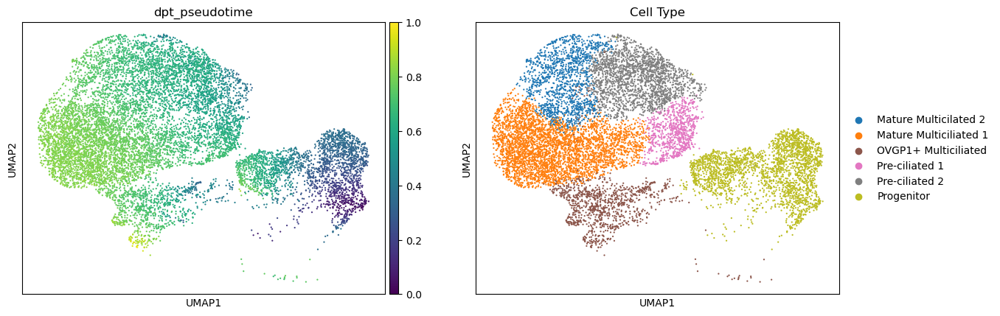

In [111]:
sc.pl.umap(ciliated, color=['dpt_pseudotime','Cell Type'])

In [115]:
gene_names =['OVGP1','FOXJ1','SPAG6','PIFO','CFAP157','C9orf24']
path = ['Progenitor','Pre-ciliated 1','Pre-ciliated 2','Mature Multicilated 2','Mature Multiciliated 1','OVGP1+ Multiciliated']
ciliated.obs["Pseudotime"] = ciliated.obs["dpt_pseudotime"]

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


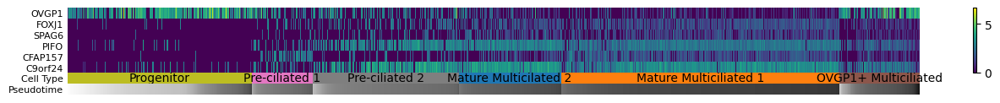

In [116]:
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(ciliated, path, gene_names, annotations=['Pseudotime'], use_raw=False, ytick_fontsize=8)

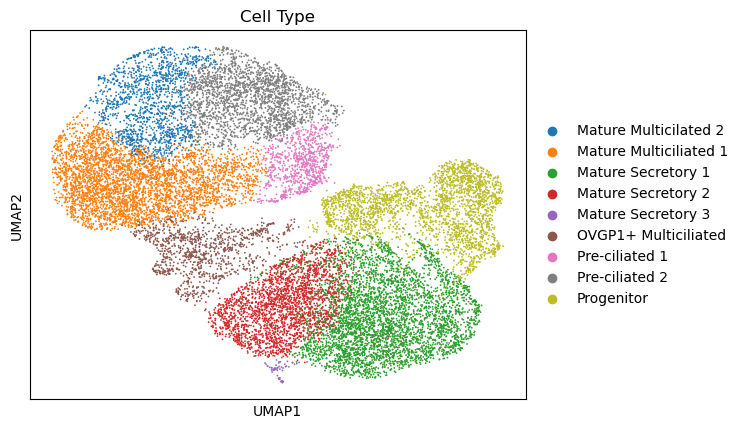

In [117]:
sc.pl.umap(epi, color=['Cell Type'])

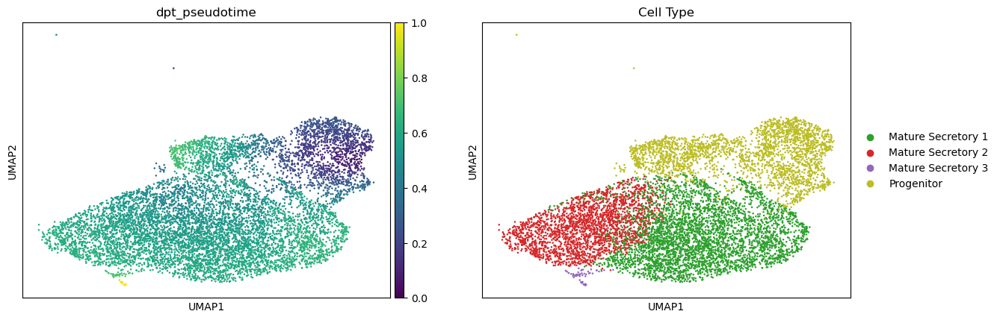

In [137]:
secretory = epi[epi.obs['Cell Type'].isin(['Progenitor','Mature Secretory 1','Mature Secretory 2','Mature Secretory 3' ])]
secretory.uns["iroot"] = np.flatnonzero(secretory.obs["Cell Type"] == "Progenitor")[400]
sc.tl.diffmap(secretory, n_comps=20)
sc.tl.dpt(secretory, n_branchings=0, n_dcs=20, min_group_size=0.1)
sc.pl.umap(secretory, color=['dpt_pseudotime','Cell Type'])

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


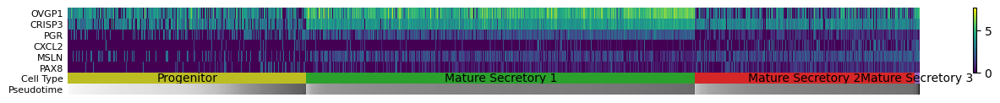

In [142]:
gene_names =['OVGP1','CRISP3','PGR','CXCL2','MSLN','PAX8']
path = ['Progenitor','Mature Secretory 1','Mature Secretory 2','Mature Secretory 3']
secretory.obs["Pseudotime"] = secretory.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(secretory, path, gene_names, annotations=['Pseudotime'], use_raw=False, ytick_fontsize=8)

In [143]:
lily = sc.read_h5ad('/Users/user/Documents/Fallopiantube/newanalysis/oviductepitheliumforconcat.h5ad')

In [144]:
lily

AnnData object with n_obs × n_vars = 14630 × 3100
    obs: 'Author', 'BioSample', 'Patient', 'Run', 'Tissue', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'leiden', 'Cell_Types', 'menstrual_status', 'Age', 'cycle_day', 'Tissuelocation', 'n_counts', 'velocity_self_transition', 'epithelial_celltypes', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std', 'velocity_offset2', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'Author_colors', 'Cell_Types_colors', 'dendrogram_epithelial_celltypes', 'epithelial_celltypes_colors', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'umap', 'velocity_graph', 'vel

In [152]:
lily.obs['epithelial_celltypes'] = lily.obs['epithelial_celltypes'].cat.rename_categories({
    'LGR5+ secretory': 'Mature Secretory-1',
    'Mature secretory': 'Mature Secretory-2'
})


In [153]:
lily.obs['epithelial_celltypes']

CellID
SRR14804445:AAACCCAGTACCCACGx                         Progenitor
SRR14804445:AACAAAGAGGTCCTGCx                    OVGP1+ ciliated
SRR14804445:AAAGGTACAGCCTTCTx                         Progenitor
SRR14804445:AAAGTGAAGGCACAACx                    OVGP1+ ciliated
SRR14804445:AAACCCACAATTCTCTx                 Mature Secretory-1
                                                    ...         
SRR10308430_KMODB:SRR10308430.sorted.bam              Progenitor
SRR10308725_MAY3G:SRR10308725.sorted.bam      Mature Secretory-1
SRR10308756_S29MY:SRR10308756.sorted.bam      Mature Secretory-2
SRR10309139_FKI51:SRR10309139.sorted.bam    Mature multiciliated
SRR10308566_BT0CU:SRR10308566.sorted.bam      Mature Secretory-2
Name: epithelial_celltypes, Length: 14630, dtype: category
Categories (8, object): ['Mature Secretory-1', 'Mature multiciliated', 'Mature Secretory-2', 'Mature secretory (Primary cilia)', 'OVGP1+ ciliated', 'Pre-ciliated-1', 'Pre-ciliated-2', 'Progenitor']

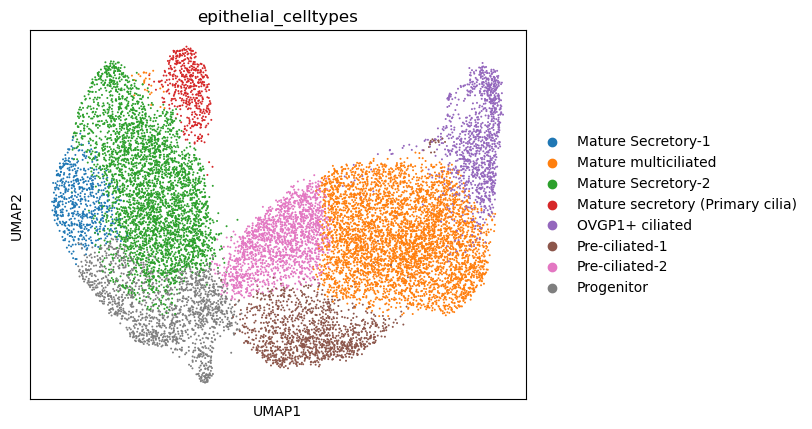

In [154]:
sc.pl.umap(lily, color='epithelial_celltypes')

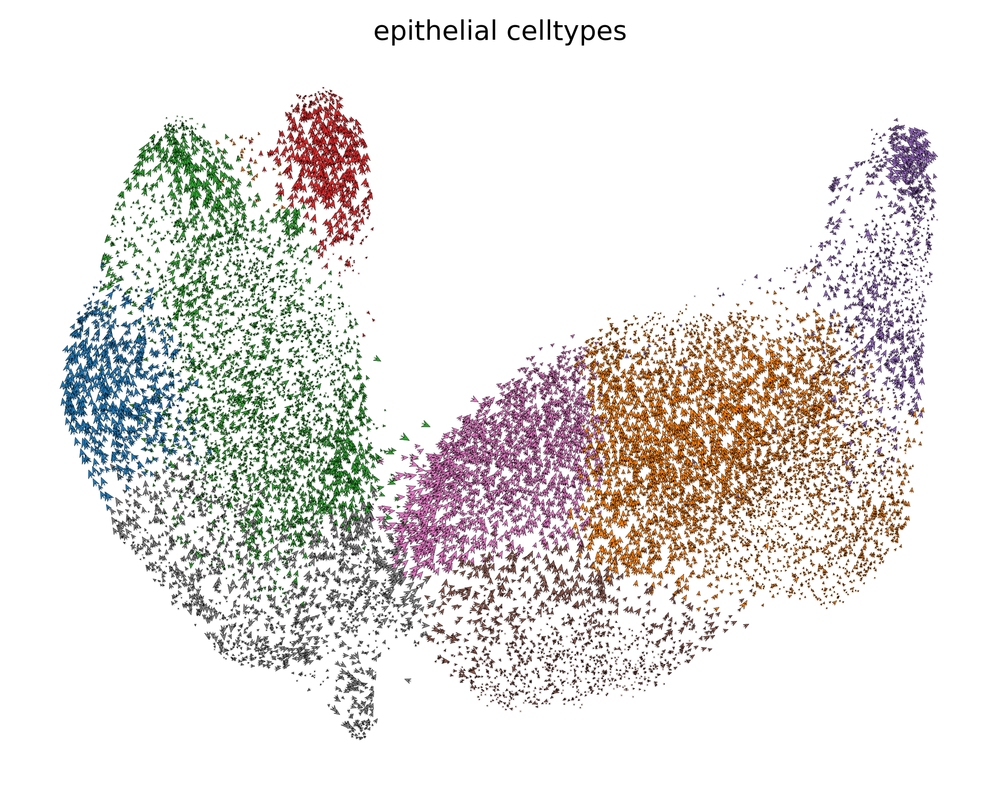

In [246]:
scv.pl.velocity_embedding(lily, color='epithelial_celltypes',arrow_length=3, arrow_size=4, dpi=400)

In [155]:
sc.tl.paga(lily, groups='epithelial_celltypes')

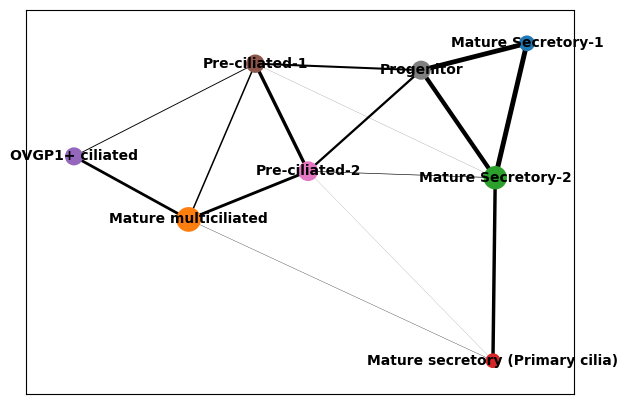

In [156]:
sc.pl.paga(lily)

In [157]:
ciliated = lily[lily.obs['epithelial_celltypes'].isin(['Progenitor','Pre-ciliated-1','Pre-ciliated-2','Mature multiciliated','OVGP1+ ciliated'])]

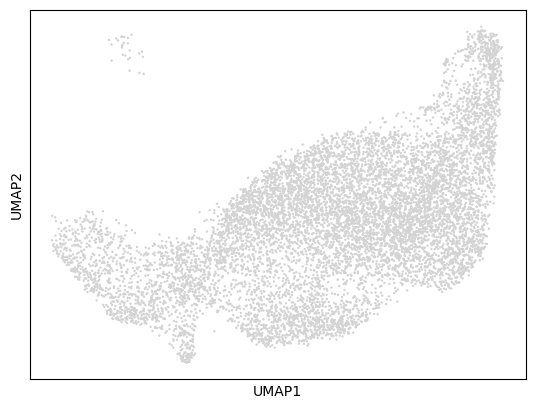

In [158]:
sc.pl.umap(ciliated)

In [173]:
ciliated.uns["iroot"] = np.flatnonzero(ciliated.obs["epithelial_celltypes"] == "Progenitor")[400]
sc.tl.diffmap(ciliated, n_comps=20)
sc.tl.dpt(ciliated, n_branchings=0, n_dcs=20, min_group_size=2)

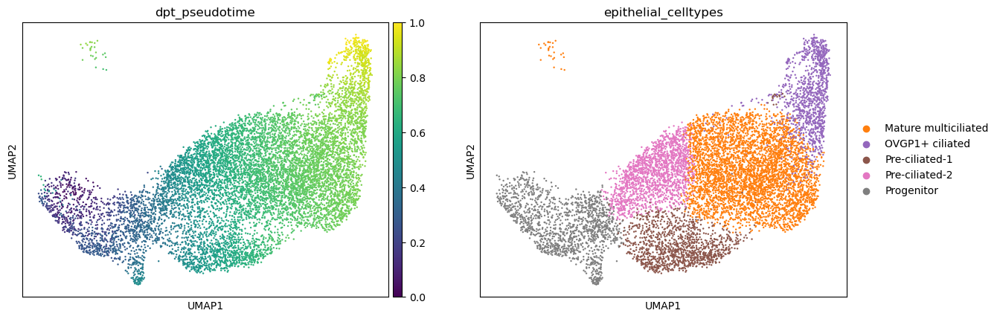

In [174]:
sc.pl.umap(ciliated, color=['dpt_pseudotime','epithelial_celltypes'])

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


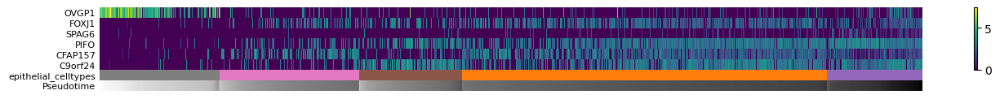

In [239]:
gene_names =['OVGP1','FOXJ1','SPAG6','PIFO','CFAP157','C9orf24']
path = ['Progenitor','Pre-ciliated-2','Pre-ciliated-1','Mature Multiciliated','OVGP1+ ciliated']
ciliated.obs["Pseudotime"] = ciliated.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(ciliated, path, gene_names, annotations=['Pseudotime'], ytick_fontsize=8, show_node_names=False)

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


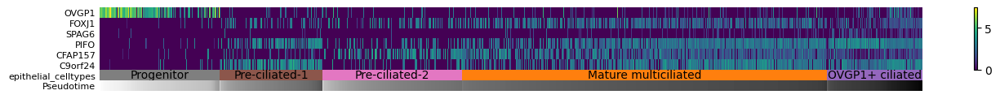

In [183]:
gene_names =['OVGP1','FOXJ1','SPAG6','PIFO','CFAP157','C9orf24']
path = ['Progenitor','Pre-ciliated-1','Pre-ciliated-2','Mature multiciliated','OVGP1+ ciliated']
ciliated.obs["Pseudotime"] = ciliated.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(ciliated, path, gene_names, annotations=['Pseudotime'], ytick_fontsize=8)

In [189]:
secretory = lily[lily.obs['epithelial_celltypes'].isin(['Progenitor','Mature Secretory-1','Mature Secretory-2',
                                                        'Mature secretory (Primary cilia)'])]

In [ ]:
secretory.obs = secretory.obs.rename(columns={'epithelial_celltypes': 'Cell Type'})

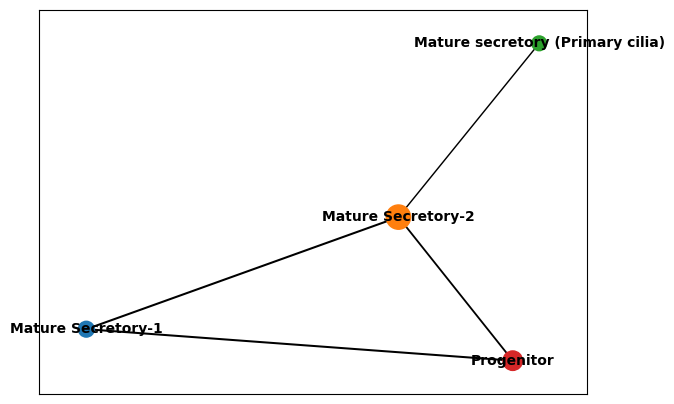

In [230]:
sc.tl.paga(secretory, groups='Cell Type')
sc.pl.paga(secretory)

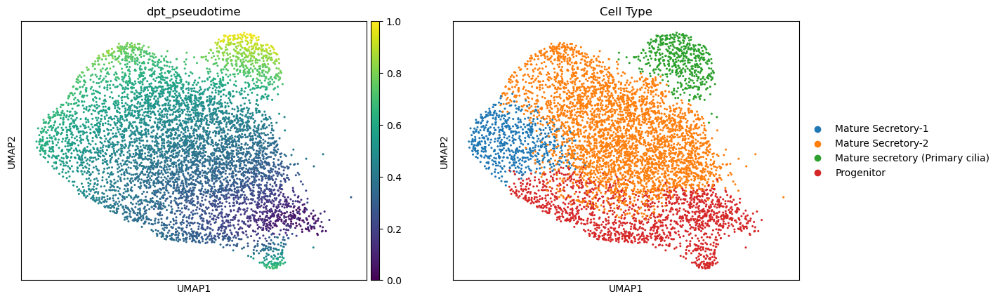

In [231]:
secretory.uns["iroot"] = np.flatnonzero(secretory.obs["Cell Type"] == "Progenitor")[700]
sc.tl.diffmap(secretory, n_comps=25)
sc.tl.dpt(secretory, n_branchings=1, n_dcs=25, min_group_size=1)
sc.pl.umap(secretory, color=['dpt_pseudotime','Cell Type'])

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


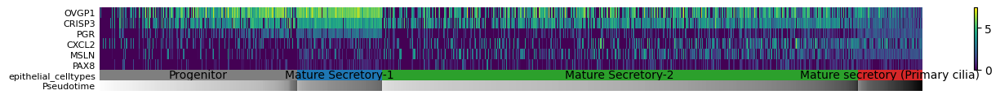

In [222]:
gene_names =['OVGP1','CRISP3','PGR','CXCL2','MSLN','PAX8']
path = ['Progenitor','Mature Secretory-2','Mature Secretory-1','Mature secretory (Primary cilia)']
secretory.obs["Pseudotime"] = secretory.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(secretory, path, gene_names, annotations=['Pseudotime'], ytick_fontsize=8)

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


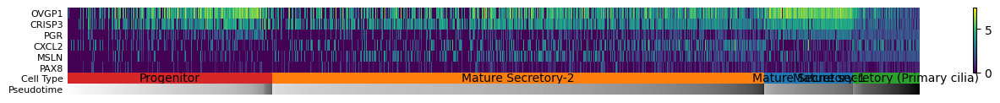

In [232]:
gene_names =['OVGP1','CRISP3','PGR','CXCL2','MSLN','PAX8']
path = ['Progenitor','Mature Secretory-2','Mature Secretory-1','Mature secretory (Primary cilia)']
secretory.obs["Pseudotime"] = secretory.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(secretory, path, gene_names, annotations=['Pseudotime'], ytick_fontsize=8)

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


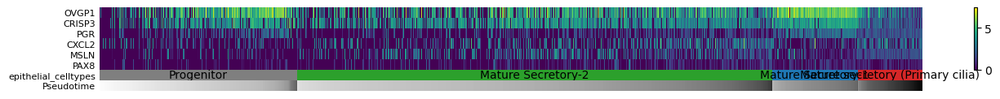

In [223]:
gene_names =['OVGP1','CRISP3','PGR','CXCL2','MSLN','PAX8']
path = ['Progenitor','Mature Secretory-2','Mature Secretory-1','Mature secretory (Primary cilia)']
secretory.obs["Pseudotime"] = secretory.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(secretory, path, gene_names, annotations=['Pseudotime'], ytick_fontsize=8)

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


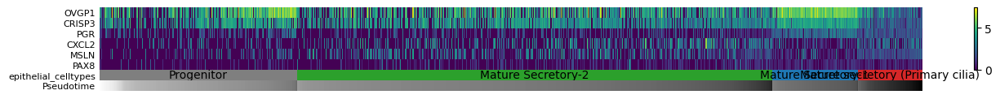

In [226]:
gene_names =['OVGP1','CRISP3','PGR','CXCL2','MSLN','PAX8']
path = ['Progenitor','Mature Secretory-2','Mature Secretory-1','Mature secretory (Primary cilia)']
secretory.obs["Pseudotime"] = secretory.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(secretory, path, gene_names, annotations=['Pseudotime'], ytick_fontsize=8)

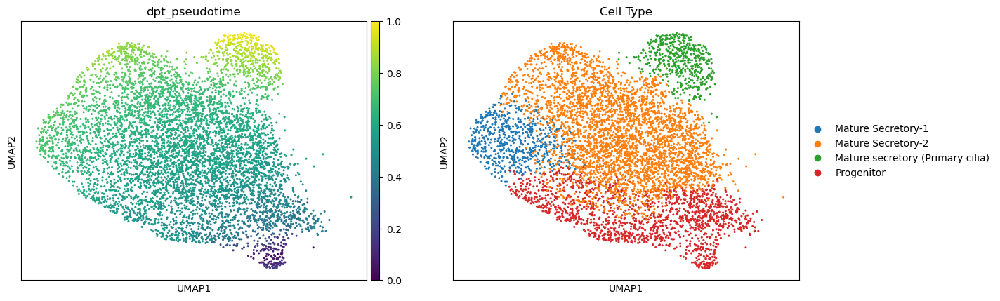

In [233]:
secretory.uns["iroot"] = np.flatnonzero(secretory.obs["Cell Type"] == "Progenitor")[100]
sc.tl.diffmap(secretory, n_comps=20)
sc.tl.dpt(secretory, n_branchings=1, n_dcs=20, min_group_size=1)
sc.pl.umap(secretory, color=['dpt_pseudotime','Cell Type'])

/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1280: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(["", xlabel, ""], fontsize=ytick_fontsize)
/Users/user/anaconda3/envs/new_env/lib/python3.12/site-packages/scanpy/plotting/_tools/paga.py:1329: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(["", anno, ""], fontsize=ytick_fontsize)


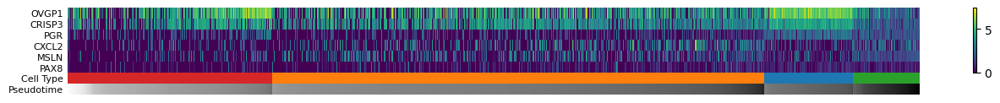

In [238]:
gene_names =['OVGP1','CRISP3','PGR','CXCL2','MSLN','PAX8']
path = ['Progenitor','Mature Secretory-2','Mature Secretory-1','Mature secretory (Primary cilia)']
secretory.obs["Pseudotime"] = secretory.obs["dpt_pseudotime"]
fig, ax = plt.subplots(figsize=(18, 1))
sc.pl.paga_path(secretory, path, gene_names, annotations=['Pseudotime'], ytick_fontsize=8, show_node_names=False)